In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn
from sklearn.preprocessing import StandardScaler, OneHotEncoder

/var/folders/5t/bxyfxy_d44b7_c_n3s1sddf40000gn/T/ipykernel_31021/1180162984.py:2: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd


In [2]:
# Configure pandas to display all columns
pd.set_option("display.max_columns", None)

In [3]:
df_cluster = pd.read_csv('bank_marketing_dataset.csv')

In [4]:
numerical_cols_c = df_cluster.select_dtypes(include=['int64', 'float64']).columns
categorical_cols = df_cluster.select_dtypes(include=['object']).columns
duration_col = ['duration']  # Column to log transform

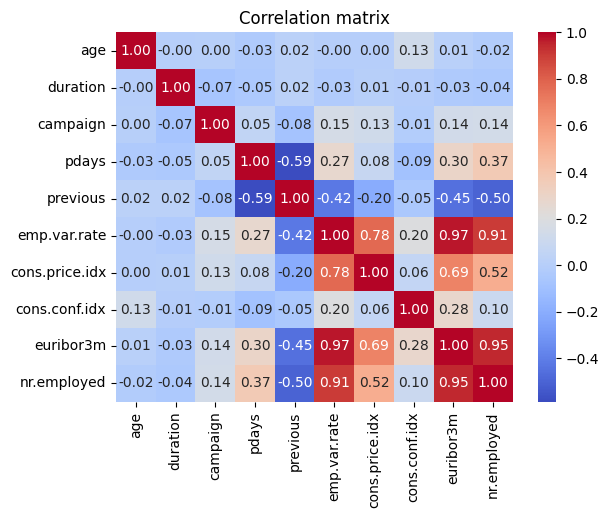

In [5]:
# Correlation matrix
corr = df_cluster[numerical_cols_c].corr()
sns.heatmap(corr, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Correlation matrix")
plt.show()

In [6]:
df_cluster = df_cluster.drop(columns=['nr.employed', 'emp.var.rate'])

In [7]:
numerical_cols_c = df_cluster.select_dtypes(include=['int64', 'float64']).columns

In [ ]:
# Copy the dataframe
X_preprocessed_df = df_cluster.copy()

# Log transform the 'duration' column
X_preprocessed_df['duration'] = np.log1p(df_cluster['duration'])

# Initialize the StandardScaler
scaler = StandardScaler()

# Scale the numerical columns
X_preprocessed_df[numerical_cols_c] = scaler.fit_transform(X_preprocessed_df[numerical_cols_c])

# Initialize the OneHotEncoder
encoder = OneHotEncoder(handle_unknown='ignore')

# Fit and transform the categorical columns to a dense format directly
X_cat_encoded = pd.DataFrame(encoder.fit_transform(X_preprocessed_df[categorical_cols]).toarray(), 
                             columns=encoder.get_feature_names_out(categorical_cols), 
                             index=X_preprocessed_df.index)

# Drop the original categorical columns
X_preprocessed_df.drop(columns=categorical_cols, inplace=True)

# Concatenate the original dataframe with the encoded dataframe
X_preprocessed_df = pd.concat([X_preprocessed_df, X_cat_encoded], axis=1)

# Print the shape of the processed dataframe
print(X_preprocessed_df.shape)

# Display the first few rows of the processed dataframe
print(X_preprocessed_df.head())

(41188, 63)
        age  duration  campaign     pdays  previous  cons.price.idx  \
0  1.533034  0.431124 -0.565922  0.195414 -0.349494        0.722722   
1  1.628993 -0.177114 -0.565922  0.195414 -0.349494        0.722722   
2 -0.290186  0.274738 -0.565922  0.195414 -0.349494        0.722722   
3 -0.002309 -0.162669 -0.565922  0.195414 -0.349494        0.722722   
4  1.533034  0.607534 -0.565922  0.195414 -0.349494        0.722722   

   cons.conf.idx  euribor3m  job_admin.  job_blue-collar  job_entrepreneur  \
0       0.886447    0.71246         0.0              0.0               0.0   
1       0.886447    0.71246         0.0              0.0               0.0   
2       0.886447    0.71246         0.0              0.0               0.0   
3       0.886447    0.71246         1.0              0.0               0.0   
4       0.886447    0.71246         0.0              0.0               0.0   

   job_housemaid  job_management  job_retired  job_self-employed  \
0            1.0        

# Testing Hier with only continuous columns

In [10]:
# Keeping only continuous variables
X_cluster = X_preprocessed_df.copy()

prefixes = ['job_', 'marital_', 'education_', 'default_', 'housing_', 'loan_', 'contact_', 'month_', 'day_of_week_', 'poutcome_', 'subscribed_']
one_hot_cols = [col for col in X_preprocessed_df.columns if any(col.startswith(prefix) for prefix in prefixes)]

# Keeping only one-hot encoded variables
X_cluster = X_preprocessed_df.drop(one_hot_cols, axis=1)

X_cluster.head()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,cons.price.idx,cons.conf.idx,euribor3m,subscribed
0,1.533034,housemaid,married,basic.4y,no,no,no,telephone,may,mon,0.431124,-0.565922,0.195414,-0.349494,nonexistent,0.722722,0.886447,0.71246,no
1,1.628993,services,married,high.school,unknown,no,no,telephone,may,mon,-0.177114,-0.565922,0.195414,-0.349494,nonexistent,0.722722,0.886447,0.71246,no
2,-0.290186,services,married,high.school,no,yes,no,telephone,may,mon,0.274738,-0.565922,0.195414,-0.349494,nonexistent,0.722722,0.886447,0.71246,no
3,-0.002309,admin.,married,basic.6y,no,no,no,telephone,may,mon,-0.162669,-0.565922,0.195414,-0.349494,nonexistent,0.722722,0.886447,0.71246,no
4,1.533034,services,married,high.school,no,no,yes,telephone,may,mon,0.607534,-0.565922,0.195414,-0.349494,nonexistent,0.722722,0.886447,0.71246,no


In [11]:
X_cluster.to_csv('X_cluster.csv', index=False)

  Using cached kneed-0.8.5-py3-none-any.whl.metadata (5.5 kB)
Using cached kneed-0.8.5-py3-none-any.whl (10 kB)
Note: you may need to restart the kernel to use updated packages.


In [16]:
from sklearn.mixture import GaussianMixture         

from sklearn.metrics import silhouette_score
from sklearn.metrics import calinski_harabasz_score
from sklearn.metrics import davies_bouldin_score 
from kneed import KneeLocator 
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score

Hierarchical using Euclidean distance

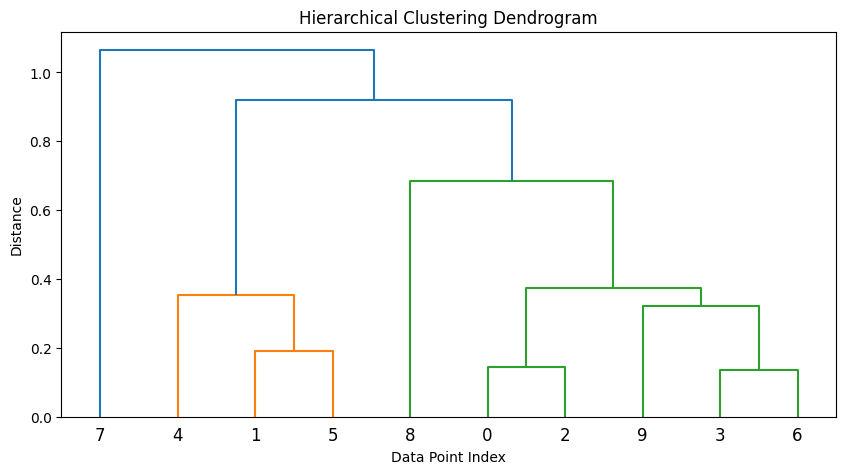

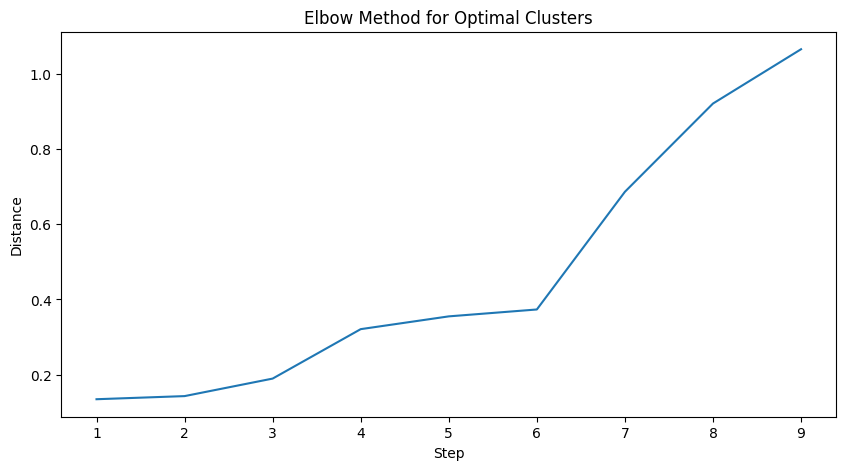

In [18]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import dendrogram, linkage

# Generating random data for demonstration
np.random.seed(0)
X = np.random.rand(10, 2)

Z = linkage(X, method='ward', metric='euclidean')  # Using Euclidean distance


# Plotting dendrogram
plt.figure(figsize=(10, 5))
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Data Point Index')
plt.ylabel('Distance')
dendrogram(Z)
plt.show()

# Implementing the elbow method
# Plotting the dendrogram distances to find the "elbow"
distances = Z[:, 2]
plt.figure(figsize=(10, 5))
plt.title('Elbow Method for Optimal Clusters')
plt.xlabel('Step')
plt.ylabel('Distance')
plt.plot(range(1, len(distances) + 1), distances)
plt.show()

In [ ]:
Hierarchical using Manhattan distance

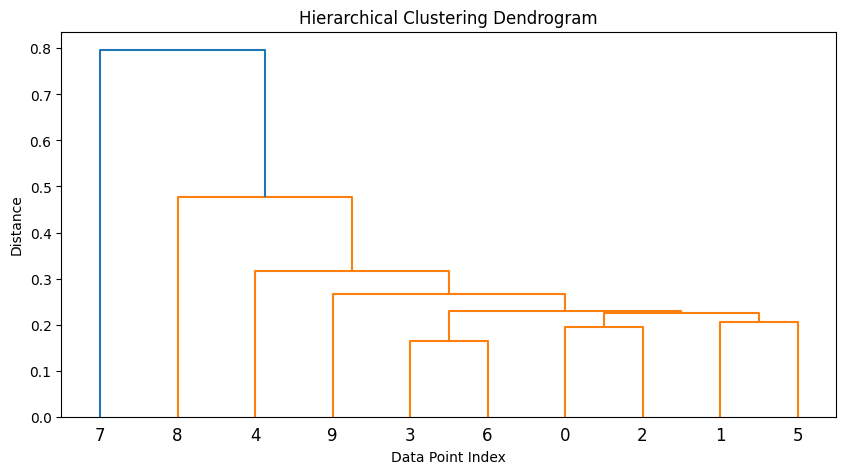

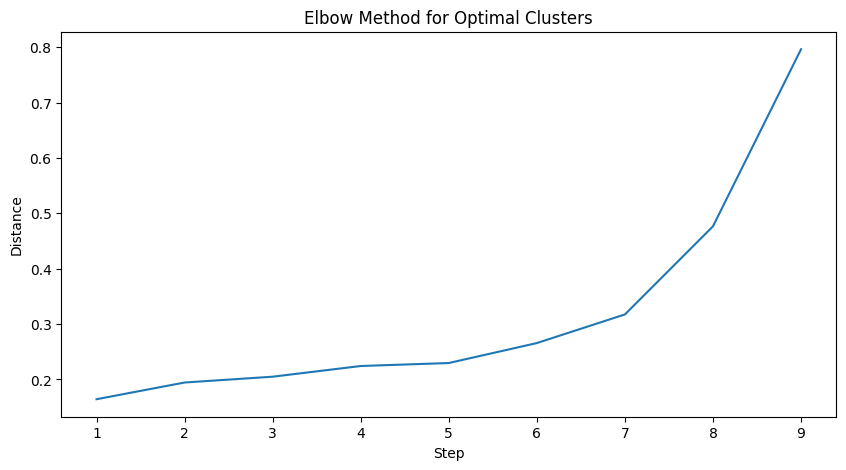

In [20]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import dendrogram, linkage

# Generating random data for demonstration
np.random.seed(0)
X = np.random.rand(10, 2)

Z = linkage(X, method='single', metric='cityblock')


# Plotting dendrogram
plt.figure(figsize=(10, 5))
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Data Point Index')
plt.ylabel('Distance')
dendrogram(Z)
plt.show()

# Implementing the elbow method
# Plotting the dendrogram distances to find the "elbow"
distances = Z[:, 2]
plt.figure(figsize=(10, 5))
plt.title('Elbow Method for Optimal Clusters')
plt.xlabel('Step')
plt.ylabel('Distance')
plt.plot(range(1, len(distances) + 1), distances)
plt.show()

Hierarchical using cosine distance

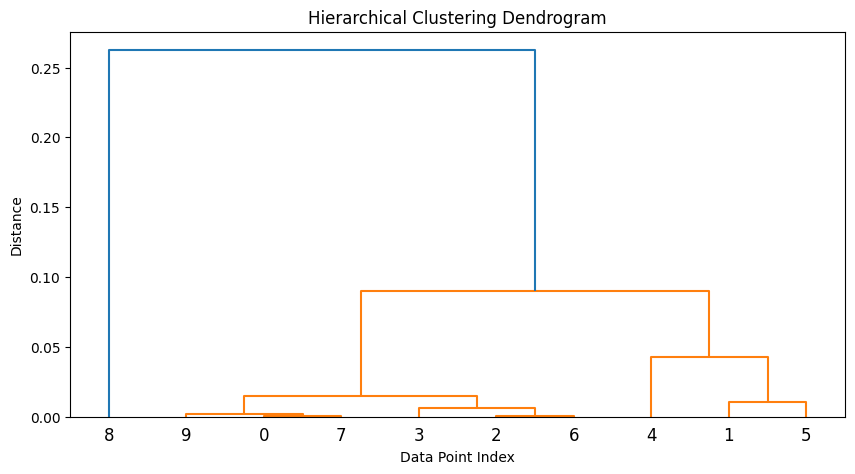

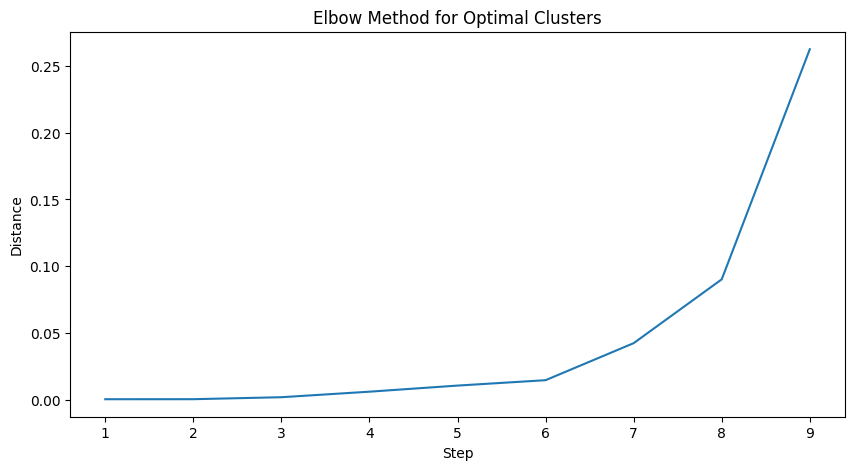

In [21]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import dendrogram, linkage

# Generating random data for demonstration
np.random.seed(0)
X = np.random.rand(10, 2)

Z = linkage(X, method='average', metric='cosine')


# Plotting dendrogram
plt.figure(figsize=(10, 5))
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Data Point Index')
plt.ylabel('Distance')
dendrogram(Z)
plt.show()

# Implementing the elbow method
# Plotting the dendrogram distances to find the "elbow"
distances = Z[:, 2]
plt.figure(figsize=(10, 5))
plt.title('Elbow Method for Optimal Clusters')
plt.xlabel('Step')
plt.ylabel('Distance')
plt.plot(range(1, len(distances) + 1), distances)
plt.show()

In [ ]:
silhouette = []
calinski_harabasz = []
davies_bouldin = []

for k in range(2, 11):
    hierarchical_clustering = AgglomerativeClustering(n_clusters=k)
    hierarchical_clustering.fit(X_cluster)

    score = silhouette_score(X_cluster, hierarchical_clustering.labels_)
    silhouette.append(score)

    score1 = calinski_harabasz_score(X_cluster, hierarchical_clustering.labels_)
    calinski_harabasz.append(score1)

    score2 = davies_bouldin_score(X_cluster, hierarchical_clustering.labels_)
    davies_bouldin.append(score2)

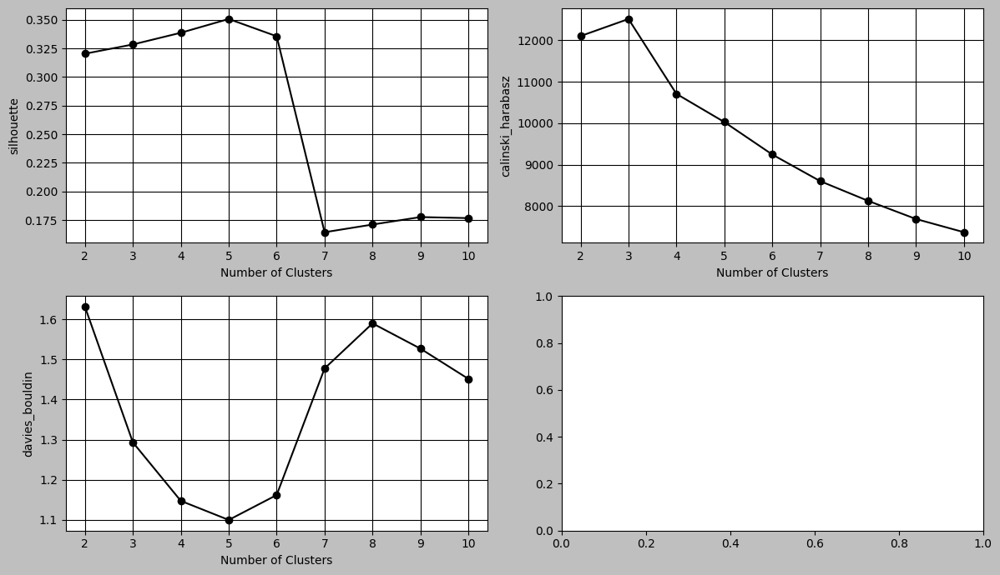

In [ ]:
plt.style.use ('grayscale')
fig, axs = plt.subplots(2, 2, figsize=(12, 7))

metrics = {'silhouette': silhouette, 'calinski_harabasz': calinski_harabasz,
           'davies_bouldin': davies_bouldin}
metrics_list = list(metrics.items()) 

for i in range(2): 
    for j in range(2): 
        index = i*2 + j
        if index < len(metrics_list):
            metric_name, metric_values = metrics_list[i*2 + j] 
            axs[i, j].plot(range(2, 11), metric_values , marker = 'o')
            axs[i, j].set_xticks(range(2, 11))
            axs[i, j].set_xlabel('Number of Clusters')
            axs[i, j].set_ylabel(metric_name)
            axs[i, j].grid(True)

plt.tight_layout()
plt.show()

In [ ]:
silhouette = []
calinski_harabasz = []
davies_bouldin = []


hierarchical_clustering = AgglomerativeClustering(n_clusters=6)
hierarchical_clustering.fit(X_cluster)

score = silhouette_score(X_cluster, hierarchical_clustering.labels_)
silhouette.append(score)

score1 = calinski_harabasz_score(X_cluster, hierarchical_clustering.labels_)
calinski_harabasz.append(score1)

score2 = davies_bouldin_score(X_cluster, hierarchical_clustering.labels_)
davies_bouldin.append(score2)

In [ ]:
# Print scores
print('silhouette_score:', silhouette)
print('calinski_harabasz_score:', calinski_harabasz)
print('davies_bouldin_score:', davies_bouldin)

silhouette_score: [0.35066044696178317]
calinski_harabasz_score: [10027.09186348489]
davies_bouldin_score: [1.1000663261248231]


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score
from sklearn.cluster import AgglomerativeClustering

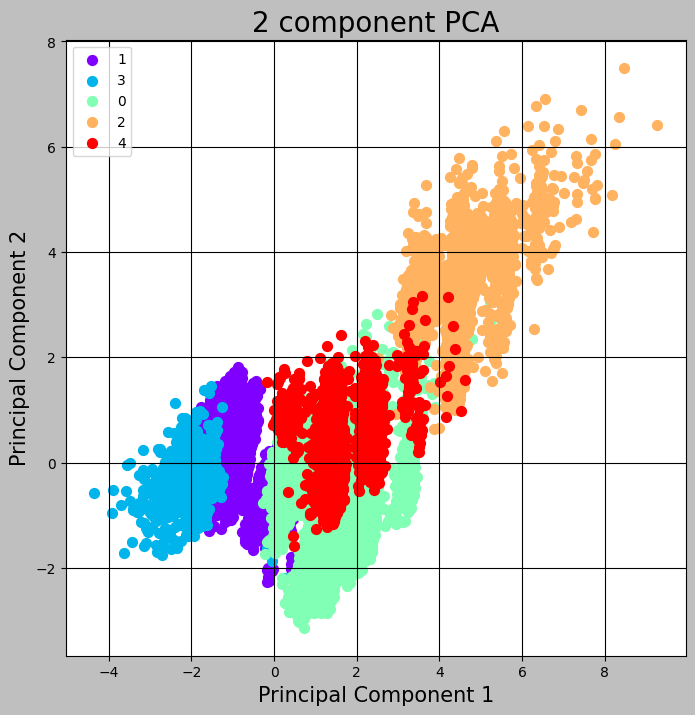

In [ ]:
# PCA for visualization
pca = PCA(n_components=2)
principalComponents = pca.fit_transform(X_cluster)
principalDf = pd.DataFrame(data=principalComponents, columns=['principal component 1', 'principal component 2'])

# Concatenate PCA results with cluster labels
finalDf = pd.concat([principalDf, pd.Series(hierarchical_clustering.labels_, name='cluster')], axis=1)

# Plotting
fig = plt.figure(figsize=(8, 8))
ax = fig.add_subplot(1, 1, 1)
ax.set_xlabel('Principal Component 1', fontsize=15)
ax.set_ylabel('Principal Component 2', fontsize=15)
ax.set_title('2 component PCA', fontsize=20)

# Define targets and colors
targets = finalDf['cluster'].unique()
colors = plt.cm.rainbow(np.linspace(0, 1, len(targets)))

# Plot each cluster separately
for target, color in zip(targets, colors):
    indicesToKeep = finalDf['cluster'] == target
    ax.scatter(finalDf.loc[indicesToKeep, 'principal component 1'],
               finalDf.loc[indicesToKeep, 'principal component 2'],
               c=color.reshape(1, -1),
               s=50,
               label=target)

ax.legend(targets)
ax.grid()

plt.show()

2 is the best choice here

In [ ]:
silhouette = []
max_iter_values = range(90, 110, 1)

for i in max_iter_values:
    hierarchical_clustering = AgglomerativeClustering(n_clusters=5)
    hierarchical_clustering.fit(X_cluster)
    score = silhouette_score(X_cluster, hierarchical_clustering.labels_)
    silhouette.append(score)

df_silhouette = pd.DataFrame(silhouette, columns=['silhouette_score'])
df_max_iter = pd.DataFrame(max_iter_values, columns=['max_iter'])
result = pd.concat([df_max_iter, df_silhouette], axis=1)
result

,max_iter,silhouette_score
0,90,0.35066
1,91,0.35066
2,92,0.35066
3,93,0.35066
4,94,0.35066
5,95,0.35066
6,96,0.35066
7,97,0.35066
8,98,0.35066
9,99,0.35066


Score does not change / evolve

In [ ]:
result.max()

max_iter            109.00000
silhouette_score      0.35066
dtype: float64

In [ ]:
silhouette = []
linkage_types = ['ward', 'complete', 'average', 'single']

for linkage_type in linkage_types:
    hierarchical_clustering = AgglomerativeClustering(n_clusters=6, linkage=linkage_type)
    hierarchical_clustering.fit(X_cluster)
    score = silhouette_score(X_cluster, hierarchical_clustering.labels_)
    silhouette.append(score)

# Creating a hierarchical DataFrame
hierarchical_data = {'linkage_types': linkage_types,
                     'silhouette_score': silhouette}

result = pd.DataFrame(hierarchical_data)

print(result)


  linkage_types  silhouette_score
0          ward          0.335572
1      complete          0.427626
2       average          0.511315
3        single          0.544158


Best silhouette score for diag

In [ ]:
silhouette = []
#n_clusters_values = range(2, 11, 1)

for n_clusters in n_clusters_values:
    hierarchical_clustering = AgglomerativeClustering(n_clusters=5)
    hierarchical_clustering.fit(X_preprocessed_df)
    score = silhouette_score(X_preprocessed_df, hierarchical_clustering.labels_)
    silhouette.append(score)

# Creating a DataFrame to store silhouette scores for different numbers of clusters
result = pd.DataFrame({'n_clusters': 5, 'silhouette_score': silhouette})

print(result)

   n_clusters  silhouette_score
0           5          0.090759
1           5          0.090759
2           5          0.090759
3           5          0.090759
4           5          0.090759
5           5          0.090759
6           5          0.090759
7           5          0.090759
8           5          0.090759


n_init doesn't matter

In [ ]:
silhouette = []
init_params_values = ['kmeans' , 'random', 'k-means++']
for i in init_params_values:
    GMM = GaussianMixture(n_components = 5, random_state = 1 , covariance_type = 'diag' ,
                          init_params = i)
    GMM.fit(X_cluster)
    score = silhouette_score(X_cluster, GMM.predict(X_cluster))
    silhouette.append(score)


df_silhouette = pd.DataFrame(silhouette, columns=['silhouette_score'])
df_init_params = pd.DataFrame(init_params_values, columns=['init_params'])
result = pd.concat([df_init_params, df_silhouette], axis=1)
result

,init_params,silhouette_score
0,kmeans,0.267452
1,random,0.261891
2,k-means++,0.153013


Default is kmeans

In [ ]:
# all scores for best parameters
GMM = GaussianMixture (n_components = 2 , random_state = 1 , covariance_type = 'diag', init_params='k-means++')
GMM.fit (X_cluster)
    
print ('silhouette_score : ' , silhouette_score (X_cluster , GMM.predict(X_cluster)))
print ('calinski_harabasz_score : ' , calinski_harabasz_score (X_cluster, GMM.predict(X_cluster)))
print ('davies_bouldin_score : ' , davies_bouldin_score (X_cluster, GMM.predict(X_cluster)))

silhouette_score :  0.3602813465255337
calinski_harabasz_score :  8465.606260925839
davies_bouldin_score :  1.619821778350159


In [ ]:
gmmV = df_cluster.copy ()
GMM = GaussianMixture (n_components = 2 , random_state = 1, covariance_type= 'diag', init_params='k-means++' )
GMM.fit (X_cluster)
gmmV ['cluster'] = GMM.predict(X_cluster)

GMM_best = GMM

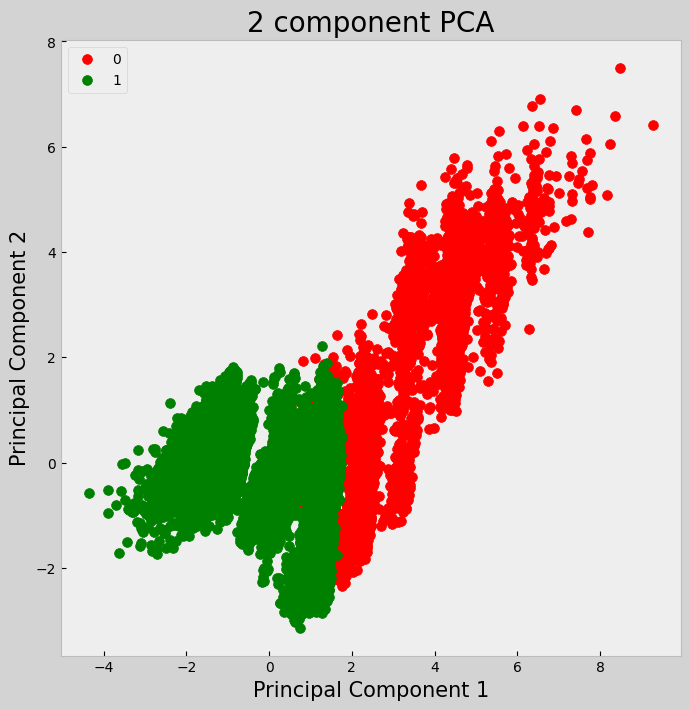

In [ ]:
# Visualizing the clusters using PCA

from sklearn.decomposition import PCA

pca = PCA(n_components=2)
principalComponents = pca.fit_transform(X_cluster)
principalDf = pd.DataFrame(data = principalComponents, columns = ['principal component 1', 'principal component 2'])

finalDf = pd.concat([principalDf, gmmV[['cluster']]], axis = 1)

fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1)
ax.set_xlabel('Principal Component 1', fontsize = 15)
ax.set_ylabel('Principal Component 2', fontsize = 15)
ax.set_title('2 component PCA', fontsize = 20)
targets = [0, 1]
colors = ['r', 'g']
for target, color in zip(targets,colors):
    indicesToKeep = finalDf['cluster'] == target
    ax.scatter(finalDf.loc[indicesToKeep, 'principal component 1']
               , finalDf.loc[indicesToKeep, 'principal component 2']
               , c = color
               , s = 50)
ax.legend(targets)
ax.grid()

<Axes: xlabel='tsne-2d-one', ylabel='tsne-2d-two'>

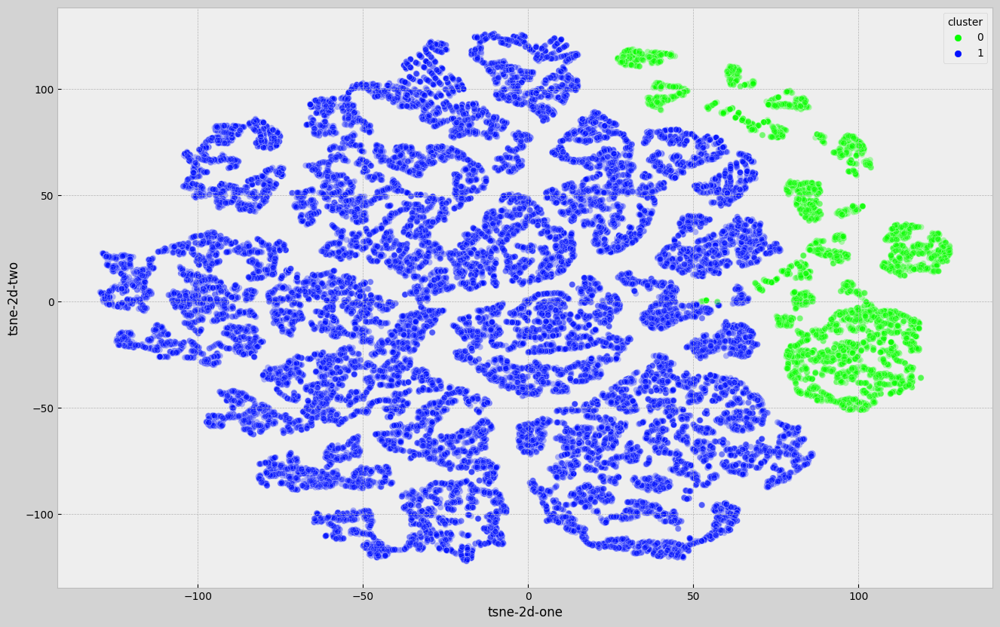

In [ ]:
# Visualizing the clusters using t-SNE

from sklearn.manifold import TSNE

tsne = TSNE(n_components=2, random_state=1)
tsne_results = tsne.fit_transform(X_cluster)

gmmV['tsne-2d-one'] = tsne_results[:,0]
gmmV['tsne-2d-two'] = tsne_results[:,1]

plt.figure(figsize=(16,10))
sns.scatterplot(
    x="tsne-2d-one", y="tsne-2d-two",
    hue="cluster",
    palette=sns.color_palette("hsv", 2),
    data=gmmV,
    legend="full",
    alpha=0.3
)

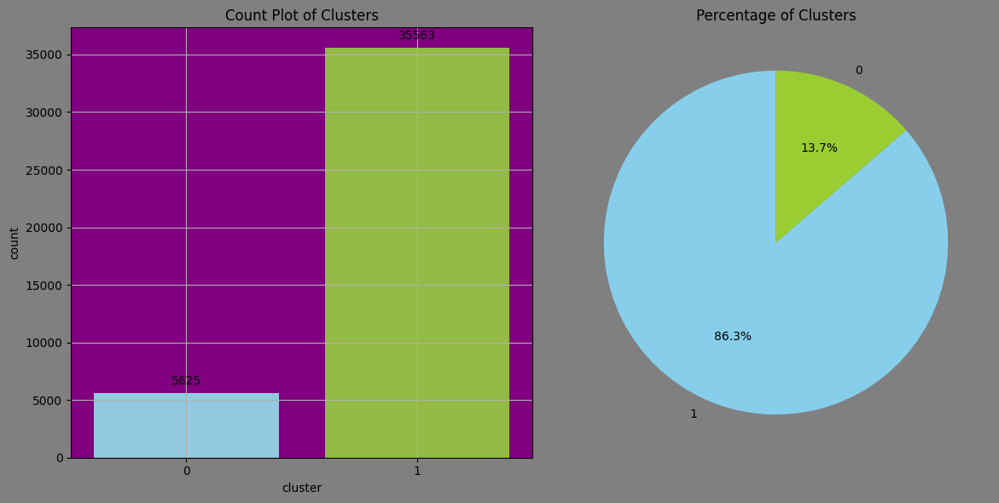

In [ ]:
plt.style.use("default")
custom_colors = ["skyblue", "yellowgreen" , 'red' , 'purple' , 'green']
fig, ax = plt.subplots(1, 2, figsize=(12,6),facecolor='gray') 
ax[0].set_facecolor('purple') 

sns.countplot(x='cluster', data=gmmV , ax=ax[0], palette=custom_colors) 
for p in ax[0].patches:
    ax[0].annotate(format(p.get_height(), '.0f'), 
                (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha = 'center', va = 'center', xytext = (0, 10), 
                textcoords = 'offset points')
ax[0].grid(True)
ax[0].set_title('Count Plot of Clusters')

cluster_counts = gmmV ['cluster'].value_counts()
ax[1].pie(cluster_counts, labels = cluster_counts.index, autopct='%1.1f%%', startangle=90, 
        colors=custom_colors)
ax[1].set_title('Percentage of Clusters')

plt.tight_layout() 
plt.show()

c:\Users\valhk\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


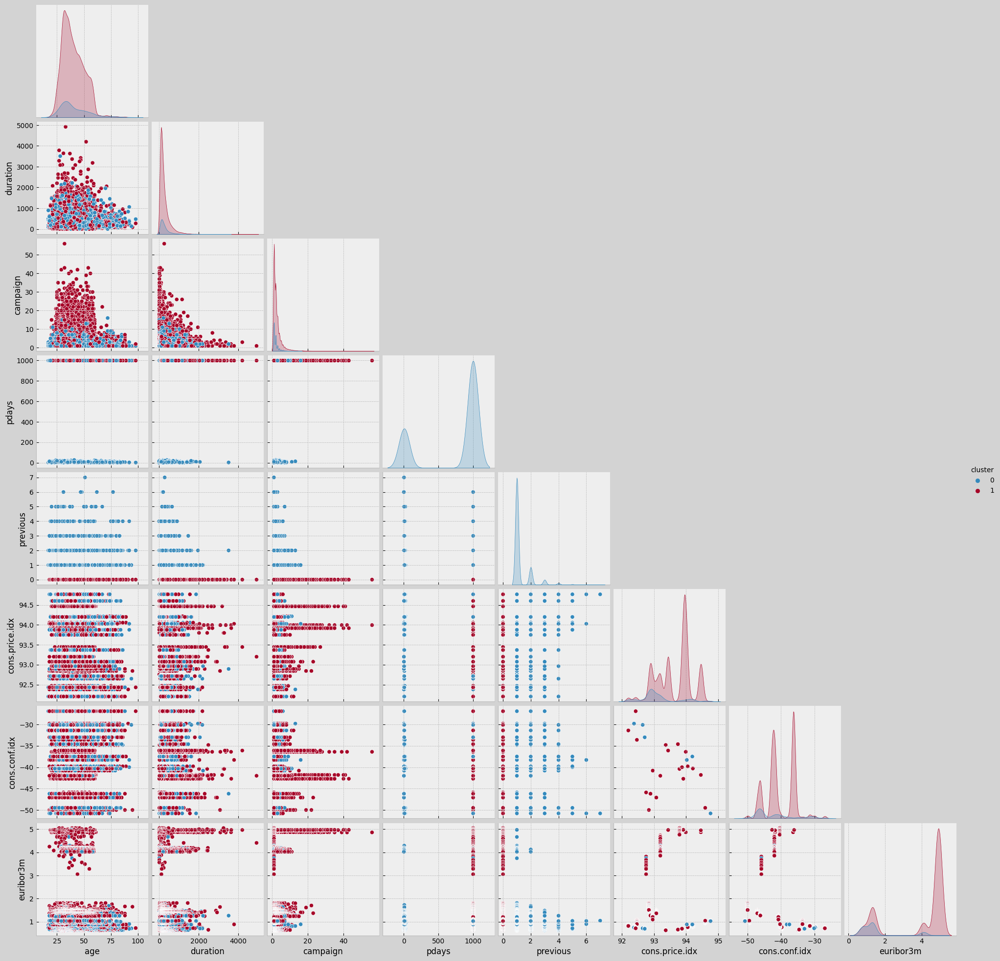

In [ ]:
columns_to_plot = ['age', 'duration', 'campaign', 'pdays', 'previous', 'cons.price.idx', 'cons.conf.idx', 'euribor3m', 'cluster']

plt.rcParams['figure.facecolor'] = 'lightgrey'
plt.style.use("bmh")
sns.pairplot(gmmV [columns_to_plot],  hue='cluster', corner=True)

# Testing GMM with all columns

In [ ]:
X_cluster_full = X_preprocessed_df.copy()

silhouette = []
calinski_harabasz = []
davies_bouldin = []
for k in range(2,11):
    GMM = GaussianMixture (n_components = k , random_state = 1)
    GMM.fit (X_cluster_full)
    
    score = silhouette_score (X_cluster_full , GMM.predict(X_cluster_full))
    silhouette.append (score)
    
    score1 = calinski_harabasz_score (X_cluster_full, GMM.predict(X_cluster_full))
    calinski_harabasz.append(score1)
    
    score2 = davies_bouldin_score (X_cluster_full, GMM.predict(X_cluster_full))
    davies_bouldin.append (score2)

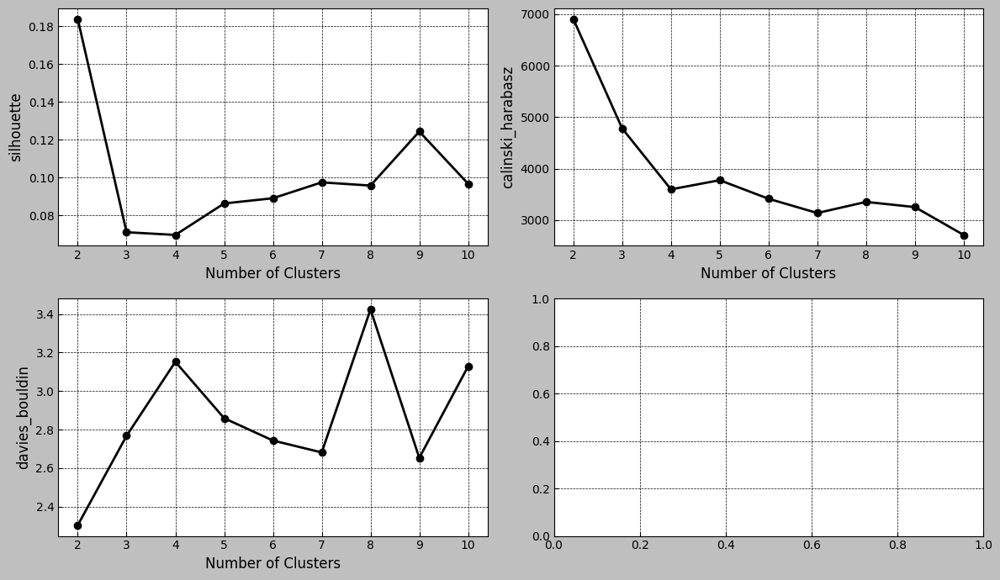

In [ ]:

plt.style.use ('grayscale')
fig, axs = plt.subplots(2, 2, figsize=(12, 7))

metrics = {'silhouette': silhouette, 'calinski_harabasz': calinski_harabasz,
           'davies_bouldin': davies_bouldin}
metrics_list = list(metrics.items()) 

for i in range(2): 
    for j in range(2): 
        index = i*2 + j
        if index < len(metrics_list):
            metric_name, metric_values = metrics_list[i*2 + j] 
            axs[i, j].plot(range(2, 11), metric_values , marker = 'o')
            axs[i, j].set_xticks(range(2, 11))
            axs[i, j].set_xlabel('Number of Clusters')
            axs[i, j].set_ylabel(metric_name)
            axs[i, j].grid(True)

plt.tight_layout()
plt.show()

Lets try the final model from before to see if we gained performance

In [ ]:
# all scores for best parameters
GMM = GaussianMixture (n_components = 2 , random_state = 1 , covariance_type = 'diag')
GMM.fit (X_cluster_full)
    
print ('silhouette_score : ' , silhouette_score (X_cluster_full , GMM.predict(X_cluster_full)))
print ('calinski_harabasz_score : ' , calinski_harabasz_score (X_cluster_full, GMM.predict(X_cluster_full)))
print ('davies_bouldin_score : ' , davies_bouldin_score (X_cluster_full, GMM.predict(X_cluster_full)))

silhouette_score :  0.18644642326358618
calinski_harabasz_score :  4638.25077336214
davies_bouldin_score :  2.5660365974285684


In [ ]:
silhouette = []
covariance_type_values = ['tied', 'diag', 'spherical', 'full']
for i in covariance_type_values:
    GMM = GaussianMixture(n_components = 2, random_state = 1, covariance_type = i)
    GMM.fit(X_cluster_full)
    score = silhouette_score(X_cluster_full, GMM.predict(X_cluster_full))
    silhouette.append(score)


df_silhouette = pd.DataFrame(silhouette, columns=['silhouette_score'])
df_covariance_type = pd.DataFrame(covariance_type_values, columns=['covariance_types'])
result = pd.concat([df_covariance_type, df_silhouette], axis=1)
result

,covariance_types,silhouette_score
0,tied,0.188818
1,diag,0.186446
2,spherical,0.181268
3,full,0.183785


This time full is best

The scores look worse, lets plot the PCA

In [ ]:
gmmV = df_cluster.copy ()
GMM = GaussianMixture (n_components = 2 , random_state = 1, covariance_type= 'tied' )
GMM.fit (X_cluster_full)
gmmV ['cluster'] = GMM.predict(X_cluster_full)

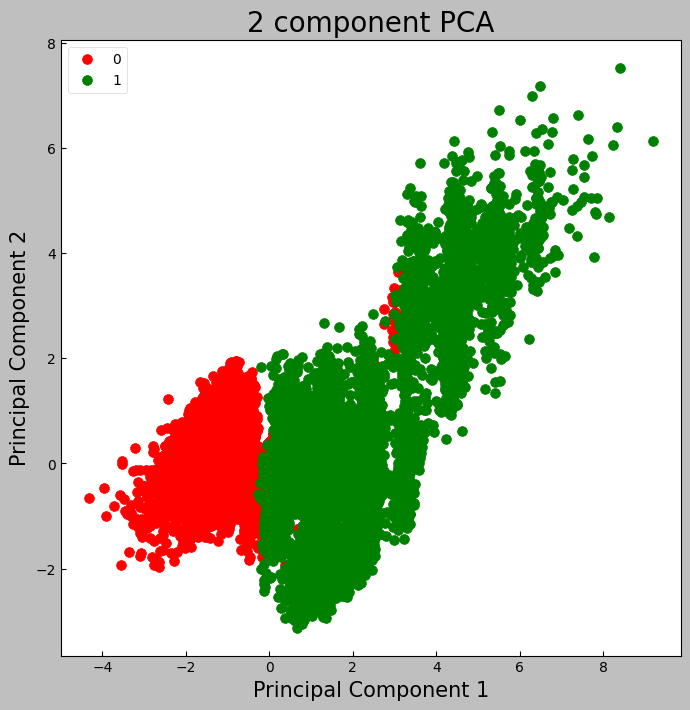

In [ ]:
# Visualizing the clusters using PCA

from sklearn.decomposition import PCA

pca = PCA(n_components=2)
principalComponents = pca.fit_transform(X_cluster_full)
principalDf = pd.DataFrame(data = principalComponents, columns = ['principal component 1', 'principal component 2'])

finalDf = pd.concat([principalDf, gmmV[['cluster']]], axis = 1)

fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1)
ax.set_xlabel('Principal Component 1', fontsize = 15)
ax.set_ylabel('Principal Component 2', fontsize = 15)
ax.set_title('2 component PCA', fontsize = 20)
targets = [0, 1]
colors = ['r', 'g']
for target, color in zip(targets,colors):
    indicesToKeep = finalDf['cluster'] == target
    ax.scatter(finalDf.loc[indicesToKeep, 'principal component 1']
               , finalDf.loc[indicesToKeep, 'principal component 2']
               , c = color
               , s = 50)
ax.legend(targets)
ax.grid()

<Axes: xlabel='tsne-2d-one', ylabel='tsne-2d-two'>

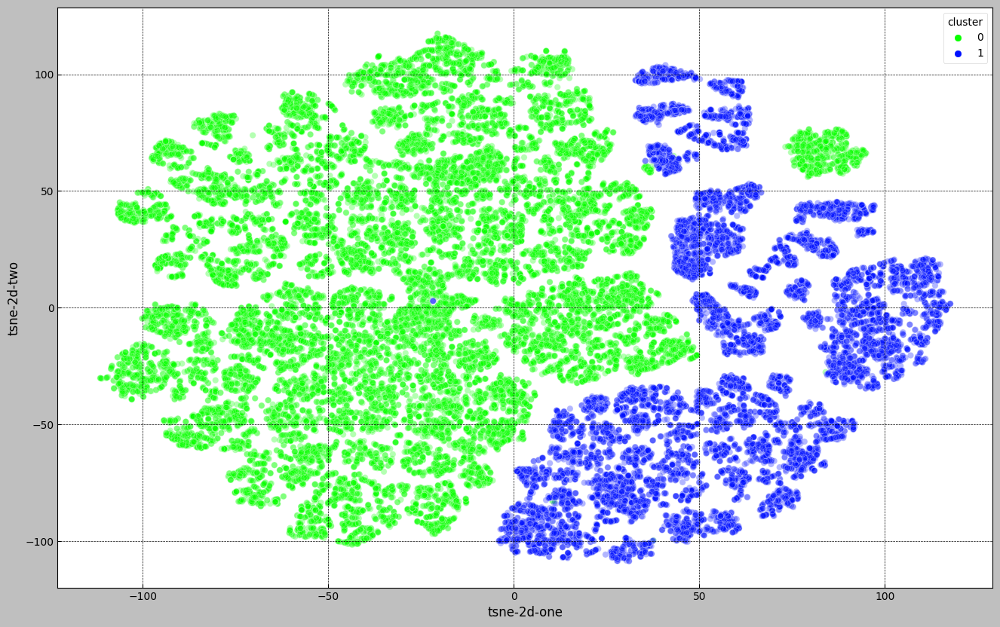

In [ ]:
# Visualizing the clusters using t-SNE

from sklearn.manifold import TSNE

tsne = TSNE(n_components=2, random_state=1)
tsne_results = tsne.fit_transform(X_cluster_full)

gmmV['tsne-2d-one'] = tsne_results[:,0]
gmmV['tsne-2d-two'] = tsne_results[:,1]

plt.figure(figsize=(16,10))
sns.scatterplot(
    x="tsne-2d-one", y="tsne-2d-two",
    hue="cluster",
    palette=sns.color_palette("hsv", 2),
    data=gmmV,
    legend="full",
    alpha=0.3
)

The visualisations also look worse

# Lets try a better approach for categorical column to improve the model

In [ ]:
X_test = df_cluster.drop(columns=['month', 'day_of_week', 'contact'])
X_test

,age,job,marital,education,default,housing,loan,duration,campaign,pdays,previous,poutcome,cons.price.idx,cons.conf.idx,euribor3m,subscribed
0,56,housemaid,married,basic.4y,no,no,no,261,1,999,0,nonexistent,93.994,-36.4,4.857,no
1,57,services,married,high.school,unknown,no,no,149,1,999,0,nonexistent,93.994,-36.4,4.857,no
2,37,services,married,high.school,no,yes,no,226,1,999,0,nonexistent,93.994,-36.4,4.857,no
3,40,admin.,married,basic.6y,no,no,no,151,1,999,0,nonexistent,93.994,-36.4,4.857,no
4,56,services,married,high.school,no,no,yes,307,1,999,0,nonexistent,93.994,-36.4,4.857,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41183,73,retired,married,professional.course,no,yes,no,334,1,999,0,nonexistent,94.767,-50.8,1.028,yes
41184,46,blue-collar,married,professional.course,no,no,no,383,1,999,0,nonexistent,94.767,-50.8,1.028,no
41185,56,retired,married,university.degree,no,yes,no,189,2,999,0,nonexistent,94.767,-50.8,1.028,no
41186,44,technician,married,professional.course,no,no,no,442,1,999,0,nonexistent,94.767,-50.8,1.028,yes


In [ ]:
X_test['duration'] = np.log1p(X_test['duration'])

scaler = StandardScaler()
X_test[numerical_cols_c] = scaler.fit_transform(X_test[numerical_cols_c])


In [ ]:
X_test['marital'].value_counts()

marital
married     24928
single      11568
divorced     4612
unknown        80
Name: count, dtype: int64

In [ ]:
# Set unknown values to single category
X_test['marital'] = X_test['marital'].replace('unknown', 'single')

In [ ]:
encoded_columns = pd.get_dummies(X_test['marital'], drop_first=True)
X_test = X_test.drop('marital', axis=1) 
X_test = pd.concat([X_test, encoded_columns], axis=1)

In [ ]:
X_test['education'].value_counts()

education
university.degree      12168
high.school             9515
basic.9y                6045
professional.course     5243
basic.4y                4176
basic.6y                2292
unknown                 1731
illiterate                18
Name: count, dtype: int64

In [ ]:
# Set basic.4y, basic.6y, basic.9y to high.school, as they are all basic education
X_test['education'] = X_test['education'].replace(['basic.4y', 'basic.6y', 'basic.9y'], 'high.school')

# Set illiterate to unknown
X_test['education'] = X_test['education'].replace('illiterate', 'unknown')

In [ ]:
encoded_columns = pd.get_dummies(X_test['education'], drop_first=True)
X_test = X_test.drop('education', axis=1) 
X_test = pd.concat([X_test, encoded_columns], axis=1)

In [ ]:
X_test['job'].value_counts()

job
admin.           10422
blue-collar       9254
technician        6743
services          3969
management        2924
retired           1720
entrepreneur      1456
self-employed     1421
housemaid         1060
unemployed        1014
student            875
unknown            330
Name: count, dtype: int64

In [ ]:
def group_jobs(job):
    if job in ['admin.', 'management']:
        return 'White-Collar'
    elif job in ['blue-collar', 'services', 'housemaid']:
        return 'Blue-Collar'
    elif job in ['self-employed', 'entrepreneur']:
        return 'Self-Employed'
    elif job in ['student', 'unemployed', 'retired']:
        return 'No-Active-Income'
    elif job == 'unknown':
        return 'Unknown'
    else:
        return 'Skilled Professionals'

X_test['job'] = X_test['job'].apply(group_jobs)


In [ ]:
encoded_columns = pd.get_dummies(X_test['job'], drop_first=True)
X_test = X_test.drop('job', axis=1) 
X_test = pd.concat([X_test, encoded_columns], axis=1)

In [ ]:
X_test['default'].value_counts()

default
no         32588
unknown     8597
yes            3
Name: count, dtype: int64

In [ ]:
X_test.drop(columns=['default'], inplace=True)

Not a very informative column

In [ ]:
X_test['housing'].value_counts()

housing
yes        21576
no         18622
unknown      990
Name: count, dtype: int64

In [ ]:
X_test['loan'].value_counts()

loan
no         33950
yes         6248
unknown      990
Name: count, dtype: int64

Might be good to drop those if we use this data or impute using knn

In [ ]:
X_test['poutcome'].value_counts()

# Maybe 1 for success, -1 for failure, 0 for nonexistent

poutcome
nonexistent    35563
failure         4252
success         1373
Name: count, dtype: int64

In [ ]:
X_test['poutcome'] = X_test['poutcome'].replace('nonexistent', 0)
X_test['poutcome'] = X_test['poutcome'].replace('failure', -1)
X_test['poutcome'] = X_test['poutcome'].replace('success', 1)

In [ ]:
X_test['subscribed'].value_counts()

subscribed
no     36548
yes     4640
Name: count, dtype: int64

In [ ]:
# Encode subscribed column
X_test['subscribed'] = X_test['subscribed'].replace('yes', 1)
X_test['subscribed'] = X_test['subscribed'].replace('no', 0)

In [ ]:
from sklearn.impute import KNNImputer
from sklearn.preprocessing import LabelEncoder

# Example encoding: 'yes' -> 1, 'no' -> 0, 'unknown' -> np.nan
def encode_columns(df, columns):
    encoded_df = df.copy()
    for col in columns:
        encoded_df[col] = encoded_df[col].map({'yes': 1, 'no': 0, 'unknown': np.nan})
    return encoded_df

# Assuming 'housing' and 'loan' are the columns to impute in X_test
X_test_1 = encode_columns(X_test, ['housing', 'loan'])

# Initialize the KNNImputer
knn_imputer = KNNImputer(n_neighbors=5, weights='uniform')

# Impute missing values
X_test_imputed = knn_imputer.fit_transform(X_test_1)

# The imputed data is returned as a NumPy array, so let's convert it back to a DataFrame
X_test_imputed_df = pd.DataFrame(X_test_imputed, columns=X_test_1.columns, index=X_test_1.index)

In [ ]:
X_test_imputed_df.head()

,age,housing,loan,duration,campaign,pdays,previous,poutcome,cons.price.idx,cons.conf.idx,euribor3m,subscribed,married,single,professional.course,university.degree,unknown,No-Active-Income,Self-Employed,Skilled Professionals,Unknown,White-Collar
0,1.533034,0.0,0.0,0.431124,-0.565922,0.195414,-0.349494,0.0,0.722722,0.886447,0.71246,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1.628993,0.0,0.0,-0.177114,-0.565922,0.195414,-0.349494,0.0,0.722722,0.886447,0.71246,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,-0.290186,1.0,0.0,0.274738,-0.565922,0.195414,-0.349494,0.0,0.722722,0.886447,0.71246,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,-0.002309,0.0,0.0,-0.162669,-0.565922,0.195414,-0.349494,0.0,0.722722,0.886447,0.71246,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4,1.533034,0.0,1.0,0.607534,-0.565922,0.195414,-0.349494,0.0,0.722722,0.886447,0.71246,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
X_cluster_full = X_test_imputed_df.copy()

silhouette = []
calinski_harabasz = []
davies_bouldin = []
for k in range(2,11):
    GMM = GaussianMixture (n_components = k , random_state = 1)
    GMM.fit (X_cluster_full)
    
    score = silhouette_score (X_cluster_full , GMM.predict(X_cluster_full))
    silhouette.append (score)
    
    score1 = calinski_harabasz_score (X_cluster_full, GMM.predict(X_cluster_full))
    calinski_harabasz.append(score1)
    
    score2 = davies_bouldin_score (X_cluster_full, GMM.predict(X_cluster_full))
    davies_bouldin.append (score2)

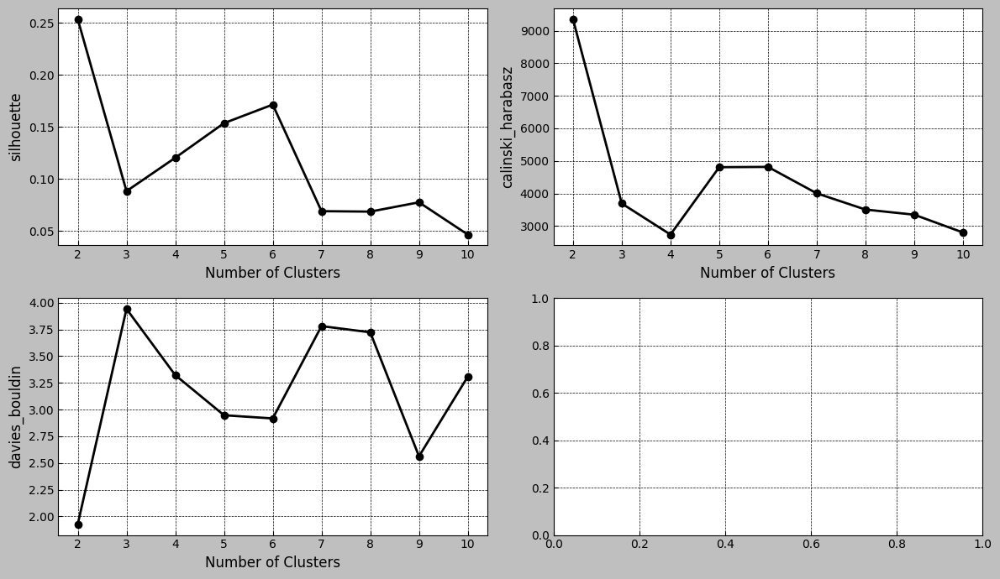

In [ ]:
plt.style.use ('grayscale')
fig, axs = plt.subplots(2, 2, figsize=(12, 7))

metrics = {'silhouette': silhouette, 'calinski_harabasz': calinski_harabasz,
           'davies_bouldin': davies_bouldin}
metrics_list = list(metrics.items()) 

for i in range(2): 
    for j in range(2): 
        index = i*2 + j
        if index < len(metrics_list):
            metric_name, metric_values = metrics_list[i*2 + j] 
            axs[i, j].plot(range(2, 11), metric_values , marker = 'o')
            axs[i, j].set_xticks(range(2, 11))
            axs[i, j].set_xlabel('Number of Clusters')
            axs[i, j].set_ylabel(metric_name)
            axs[i, j].grid(True)

plt.tight_layout()
plt.show()

In [ ]:
silhouette = []
covariance_type_values = ['tied', 'diag', 'spherical', 'full']
for i in covariance_type_values:
    GMM = GaussianMixture(n_components = 2, random_state = 1, covariance_type = i)
    GMM.fit(X_cluster_full)
    score = silhouette_score(X_cluster_full, GMM.predict(X_cluster_full))
    silhouette.append(score)


df_silhouette = pd.DataFrame(silhouette, columns=['silhouette_score'])
df_covariance_type = pd.DataFrame(covariance_type_values, columns=['covariance_types'])
result = pd.concat([df_covariance_type, df_silhouette], axis=1)
result

,covariance_types,silhouette_score
0,tied,0.257648
1,diag,0.253552
2,spherical,0.235082
3,full,0.253550


In [ ]:
# all scores for best parameters
GMM = GaussianMixture (n_components = 2 , random_state = 1 , covariance_type = 'tied')
GMM.fit (X_cluster_full)
    
print ('silhouette_score : ' , silhouette_score (X_cluster_full , GMM.predict(X_cluster_full)))
print ('calinski_harabasz_score : ' , calinski_harabasz_score (X_cluster_full, GMM.predict(X_cluster_full)))
print ('davies_bouldin_score : ' , davies_bouldin_score (X_cluster_full, GMM.predict(X_cluster_full)))

silhouette_score :  0.2576481084387642
calinski_harabasz_score :  9165.64319452498
davies_bouldin_score :  1.9313854627554636


The silhouette score does not increase using the added categorical variables

# DBSCAN

## using only numerical data

In [ ]:
from sklearn.cluster import DBSCAN

silhouette = []
calinski_harabasz = []
davies_bouldin = []
eps_values = []
min_samples_values = []
for eps in range (10 , 20):
    eps = eps / 10
    for min_samples in range (9 , 15):
        DB = DBSCAN (eps = eps , min_samples = min_samples , n_jobs = -1)
        DB.fit (X_cluster)
        
        eps_values.append(eps)
        min_samples_values.append(min_samples)
        score = silhouette_score (X_cluster , DB.fit_predict(X_cluster))
        silhouette.append (score)
        score1 = calinski_harabasz_score (X_cluster, DB.fit_predict(X_cluster))
        calinski_harabasz.append(score1)
        score2 = davies_bouldin_score (X_cluster, DB.fit_predict(X_cluster))
        davies_bouldin.append (score2)
        
df_eps = pd.DataFrame(eps_values, columns=['eps'])
df_min_samples = pd.DataFrame(min_samples_values, columns=['min_samples'])    
df_silhouette = pd.DataFrame(silhouette, columns=['silhouette_score'])
df_calinski_harabasz = pd.DataFrame(calinski_harabasz, columns=['calinski_harabasz'])
df_davies_bouldin = pd.DataFrame(davies_bouldin , columns=['davies_bouldin'])

result = pd.concat([df_eps, df_min_samples,df_silhouette , df_calinski_harabasz , df_davies_bouldin], axis=1)
result

,eps,min_samples,silhouette_score,calinski_harabasz,davies_bouldin
0,1.0,9,0.125155,1577.866299,1.695746
1,1.0,10,0.124938,1727.388931,1.714267
2,1.0,11,0.124788,1714.581903,1.704768
3,1.0,12,0.123318,1586.375040,1.654159
4,1.0,13,0.119053,1549.447844,1.625444
5,1.0,14,0.115355,1433.361341,1.588638
6,1.1,9,0.123116,1478.381852,1.666990
7,1.1,10,0.122300,1531.850032,1.672118
8,1.1,11,0.126187,1659.993467,1.709022
9,1.1,12,0.126297,1701.682051,1.717423


In [ ]:
top_5_silhouette_score = result.nlargest(5, 'silhouette_score')
top_5_calinski_harabasz = result.nlargest(5, 'calinski_harabasz')
top_5_davies_bouldin = result.nsmallest(5, 'davies_bouldin')

print ('Top 5 silhouette scores : \n' , top_5_silhouette_score)
print ('Top 5 calinski harabasz scores : \n' , top_5_calinski_harabasz)
print ('Top 5 davies bouldin scores : \n' , top_5_davies_bouldin)

Top 5 silhouette scores : 
     eps  min_samples  silhouette_score  calinski_harabasz  davies_bouldin
54  1.9            9          0.213559        1142.852305        1.834741
55  1.9           10          0.213415        1140.855111        1.830506
48  1.8            9          0.213156        1138.775649        1.823699
56  1.9           11          0.212840        1211.921415        1.857808
49  1.8           10          0.212739        1135.643719        1.821812
Top 5 calinski harabasz scores : 
     eps  min_samples  silhouette_score  calinski_harabasz  davies_bouldin
10  1.1           13          0.125899        1751.294724        1.728638
11  1.1           14          0.125402        1737.828151        1.721007
1   1.0           10          0.124938        1727.388931        1.714267
2   1.0           11          0.124788        1714.581903        1.704768
9   1.1           12          0.126297        1701.682051        1.717423
Top 5 davies bouldin scores : 
     eps  min_samp

Results seem pretty bad for DBSCAN, so we will not use it.

In [ ]:
DBV = X_cluster_full.copy ()
DB = DBSCAN (eps = 1.7 , min_samples = 12 , n_jobs = -1)
DB.fit (X_cluster_full)
DBV ['cluster'] = DB.fit_predict (X_cluster_full)

In [ ]:
# Print scores
print ('silhouette_score : ' , silhouette_score (X_cluster_full , DB.fit_predict(X_cluster_full)))
print ('calinski_harabasz_score : ' , calinski_harabasz_score (X_cluster_full, DB.fit_predict(X_cluster_full)))
print ('davies_bouldin_score : ' , davies_bouldin_score (X_cluster_full, DB.fit_predict(X_cluster_full)))

silhouette_score :  0.11374918136935998
calinski_harabasz_score :  804.3279444995479
davies_bouldin_score :  1.7706112203621809


In [ ]:
# print cluster counts
print (DBV ['cluster'].value_counts())

cluster
 0     34989
 1      3077
-1      1842
 3       600
 4       311
 2       111
 7        88
 13       65
 12       18
 10       18
 6        16
 5        14
 9        14
 8        13
 11       12
Name: count, dtype: int64


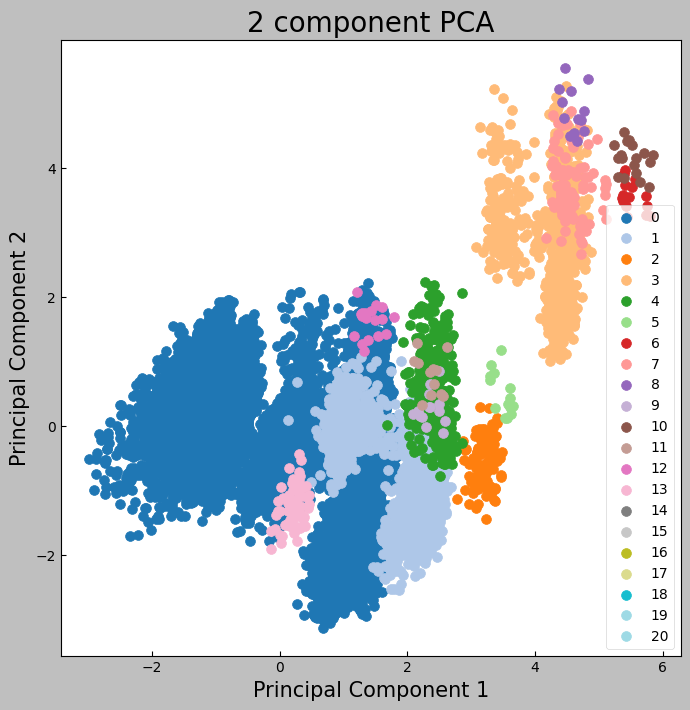

In [ ]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import pandas as pd

# Assuming X_cluster_full is your dataset after preprocessing and DBV['cluster'] contains the cluster assignments

pca = PCA(n_components=2)
principalComponents = pca.fit_transform(X_cluster_full)
principalDf = pd.DataFrame(data = principalComponents, columns = ['principal component 1', 'principal component 2'])

# Assuming DBV['cluster'] contains the cluster labels for each point
finalDf = pd.concat([principalDf, DBV[['cluster']]], axis=1)

fig = plt.figure(figsize=(8, 8))
ax = fig.add_subplot(1, 1, 1)
ax.set_xlabel('Principal Component 1', fontsize=15)
ax.set_ylabel('Principal Component 2', fontsize=15)
ax.set_title('2 component PCA', fontsize=20)

# Update for 14 clusters
targets = list(range(21))  # Assuming cluster labels are 0 through 13
# Use a colormap to generate 14 distinct colors
colors = plt.cm.tab20(np.linspace(0, 1, 21))

for target, color in zip(targets, colors):
    indicesToKeep = finalDf['cluster'] == target
    ax.scatter(finalDf.loc[indicesToKeep, 'principal component 1'],
               finalDf.loc[indicesToKeep, 'principal component 2'],
               c=[color],
               s=50)

ax.legend(targets)
ax.grid()


C:\Users\valhk\AppData\Local\Temp\ipykernel_472\3870949145.py:12: UserWarning: The palette list has more values (21) than needed (15), which may not be intended.
  sns.scatterplot(


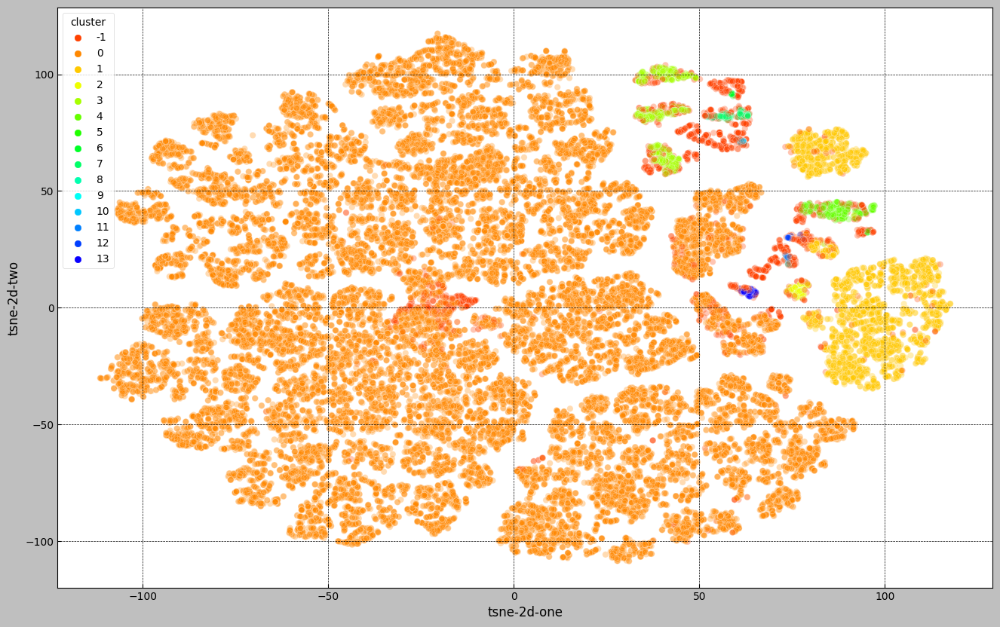

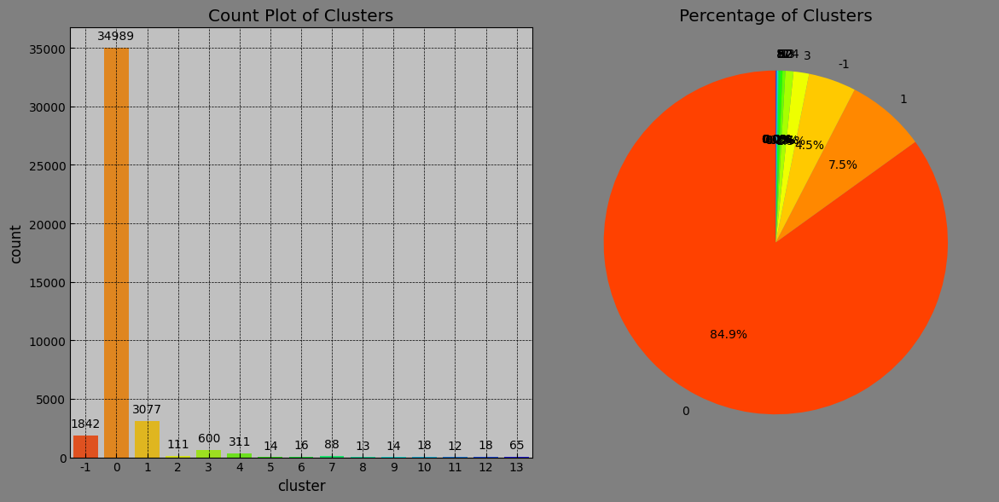

In [ ]:
from sklearn.manifold import TSNE
import seaborn as sns
import matplotlib.pyplot as plt

tsne = TSNE(n_components=2, random_state=1)
tsne_results = tsne.fit_transform(X_cluster_full)

DBV['tsne-2d-one'] = tsne_results[:, 0]
DBV['tsne-2d-two'] = tsne_results[:, 1]

plt.figure(figsize=(16, 10))
sns.scatterplot(
    x="tsne-2d-one", y="tsne-2d-two",
    hue="cluster",
    palette=sns.color_palette("hsv", 21),  
    data=DBV,
    legend="full",
    alpha=0.3
)

custom_colors = sns.color_palette("hsv", 21)  
fig, ax = plt.subplots(1, 2, figsize=(12, 6), facecolor='gray')
ax[0].set_facecolor('silver')

sns.countplot(x='cluster', data=DBV, ax=ax[0], palette=custom_colors)
for p in ax[0].patches:
    ax[0].annotate(format(p.get_height(), '.0f'),
                   (p.get_x() + p.get_width() / 2., p.get_height()),
                   ha='center', va='center', xytext=(0, 10),
                   textcoords='offset points')
ax[0].grid(True)
ax[0].set_title('Count Plot of Clusters')

cluster_counts = DBV['cluster'].value_counts()
ax[1].pie(cluster_counts, labels=cluster_counts.index, autopct='%1.1f%%', startangle=90,
          colors=custom_colors)
ax[1].set_title('Percentage of Clusters')

plt.tight_layout()
plt.show()


DB scan performs pretty poorly. Let's not try with categorical variables

## Using only numerical variables

In [ ]:
X_cluster

,age,duration,campaign,pdays,previous,cons.price.idx,cons.conf.idx,euribor3m
0,1.533034,0.431124,-0.565922,0.195414,-0.349494,0.722722,0.886447,0.712460
1,1.628993,-0.177114,-0.565922,0.195414,-0.349494,0.722722,0.886447,0.712460
2,-0.290186,0.274738,-0.565922,0.195414,-0.349494,0.722722,0.886447,0.712460
3,-0.002309,-0.162669,-0.565922,0.195414,-0.349494,0.722722,0.886447,0.712460
4,1.533034,0.607534,-0.565922,0.195414,-0.349494,0.722722,0.886447,0.712460
...,...,...,...,...,...,...,...,...
41183,3.164336,0.699178,-0.565922,0.195414,-0.349494,2.058168,-2.224953,-1.495186
41184,0.573445,0.848058,-0.565922,0.195414,-0.349494,2.058168,-2.224953,-1.495186
41185,1.533034,0.080692,-0.204909,0.195414,-0.349494,2.058168,-2.224953,-1.495186
41186,0.381527,1.003934,-0.565922,0.195414,-0.349494,2.058168,-2.224953,-1.495186


In [ ]:
silhouette = []
calinski_harabasz = []
davies_bouldin = []
eps_values = []
min_samples_values = []
for eps in range (10 , 20):
    eps = eps / 10
    for min_samples in range (9 , 15):
        DB = DBSCAN (eps = eps , min_samples = min_samples , n_jobs = -1)
        DB.fit (X_cluster)
        
        eps_values.append(eps)
        min_samples_values.append(min_samples)
        score = silhouette_score (X_cluster , DB.fit_predict(X_cluster))
        silhouette.append (score)
        score1 = calinski_harabasz_score (X_cluster, DB.fit_predict(X_cluster))
        calinski_harabasz.append(score1)
        score2 = davies_bouldin_score (X_cluster, DB.fit_predict(X_cluster))
        davies_bouldin.append (score2)
        
df_eps = pd.DataFrame(eps_values, columns=['eps'])
df_min_samples = pd.DataFrame(min_samples_values, columns=['min_samples'])    
df_silhouette = pd.DataFrame(silhouette, columns=['silhouette_score'])
df_calinski_harabasz = pd.DataFrame(calinski_harabasz, columns=['calinski_harabasz'])
df_davies_bouldin = pd.DataFrame(davies_bouldin , columns=['davies_bouldin'])

result = pd.concat([df_eps, df_min_samples,df_silhouette , df_calinski_harabasz , df_davies_bouldin], axis=1)
result

,eps,min_samples,silhouette_score,calinski_harabasz,davies_bouldin
0,1.0,9,0.125155,1577.866299,1.695746
1,1.0,10,0.124938,1727.388931,1.714267
2,1.0,11,0.124788,1714.581903,1.704768
3,1.0,12,0.123318,1586.375040,1.654159
4,1.0,13,0.119053,1549.447844,1.625444
5,1.0,14,0.115355,1433.361341,1.588638
6,1.1,9,0.123116,1478.381852,1.666990
7,1.1,10,0.122300,1531.850032,1.672118
8,1.1,11,0.126187,1659.993467,1.709022
9,1.1,12,0.126297,1701.682051,1.717423


In [ ]:
top_5_silhouette_score = result.nlargest(5, 'silhouette_score')
top_5_calinski_harabasz = result.nlargest(5, 'calinski_harabasz')
top_5_davies_bouldin = result.nsmallest(5, 'davies_bouldin')

print ('Top 5 silhouette scores : \n' , top_5_silhouette_score)
print ('Top 5 calinski harabasz scores : \n' , top_5_calinski_harabasz)
print ('Top 5 davies bouldin scores : \n' , top_5_davies_bouldin)

Top 5 silhouette scores : 
     eps  min_samples  silhouette_score  calinski_harabasz  davies_bouldin
54  1.9            9          0.213559        1142.852305        1.834741
55  1.9           10          0.213415        1140.855111        1.830506
48  1.8            9          0.213156        1138.775649        1.823699
56  1.9           11          0.212840        1211.921415        1.857808
49  1.8           10          0.212739        1135.643719        1.821812
Top 5 calinski harabasz scores : 
     eps  min_samples  silhouette_score  calinski_harabasz  davies_bouldin
10  1.1           13          0.125899        1751.294724        1.728638
11  1.1           14          0.125402        1737.828151        1.721007
1   1.0           10          0.124938        1727.388931        1.714267
2   1.0           11          0.124788        1714.581903        1.704768
9   1.1           12          0.126297        1701.682051        1.717423
Top 5 davies bouldin scores : 
     eps  min_samp

In [ ]:
DBV = X_cluster_full.copy ()
DB = DBSCAN (eps = 1.9 , min_samples = 9 , n_jobs = -1)
DB.fit (X_cluster_full)
DBV ['cluster'] = DB.fit_predict (X_cluster_full)

In [ ]:
# Print scores
print ('silhouette_score : ' , silhouette_score (X_cluster_full , DB.fit_predict(X_cluster_full)))
print ('calinski_harabasz_score : ' , calinski_harabasz_score (X_cluster_full, DB.fit_predict(X_cluster_full)))
print ('davies_bouldin_score : ' , davies_bouldin_score (X_cluster_full, DB.fit_predict(X_cluster_full)))

silhouette_score :  0.14868102307450365
calinski_harabasz_score :  913.3771199590337
davies_bouldin_score :  1.844057341927809


Not worth exploring more

# MeanShift

In [ ]:
from sklearn.cluster import MeanShift

MS = MeanShift ()
MS.fit (X_cluster)
labels = MS.labels_
len (set (labels))

6

In [ ]:
# print bandwidth

print (MS.get_params())

# print scores

print ('silhouette_score : ' , silhouette_score (X_cluster , labels))
print ('calinski_harabasz_score : ' , calinski_harabasz_score (X_cluster, labels))
print ('davies_bouldin_score : ' , davies_bouldin_score (X_cluster, labels))

{'bandwidth': None, 'bin_seeding': False, 'cluster_all': True, 'max_iter': 300, 'min_bin_freq': 1, 'n_jobs': None, 'seeds': None}


silhouette_score :  0.5253757683983563
calinski_harabasz_score :  2190.6908689358556
davies_bouldin_score :  1.509877065533087


In [ ]:
# print cluster counts
print (pd.Series(labels).value_counts())

0    39600
1     1441
2       67
4       40
3       35
5        5
Name: count, dtype: int64


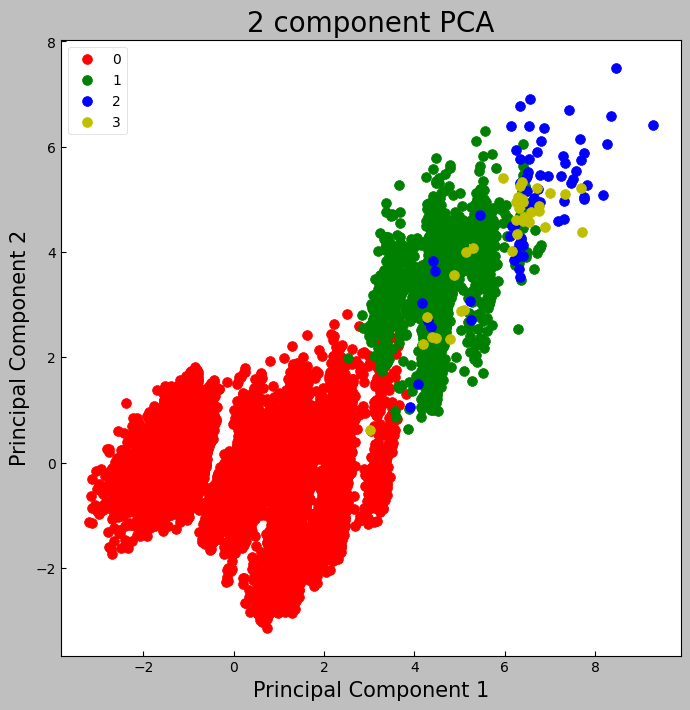

In [ ]:
# Visualizing the clusters using PCA for the 4 clusters

from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

pca = PCA(n_components=2)
principalComponents = pca.fit_transform(X_cluster)
principalDf = pd.DataFrame(data = principalComponents, columns = ['principal component 1', 'principal component 2'])

finalDf = pd.concat([principalDf, pd.DataFrame({'cluster': labels})], axis = 1)

fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1)
ax.set_xlabel('Principal Component 1', fontsize = 15)
ax.set_ylabel('Principal Component 2', fontsize = 15)
ax.set_title('2 component PCA', fontsize = 20)
targets = list(set(labels))
colors = ['r', 'g', 'b', 'y']
for target, color in zip(targets,colors):
    indicesToKeep = finalDf['cluster'] == target
    ax.scatter(finalDf.loc[indicesToKeep, 'principal component 1']
               , finalDf.loc[indicesToKeep, 'principal component 2']
               , c = color
               , s = 50)
ax.legend(targets)
ax.grid()

C:\Users\valhk\AppData\Local\Temp\ipykernel_472\1037326354.py:14: UserWarning: 
The palette list has fewer values (6) than needed (15) and will cycle, which may produce an uninterpretable plot.
  sns.scatterplot(


Text(0.5, 1.0, 'Count Plot of Clusters')

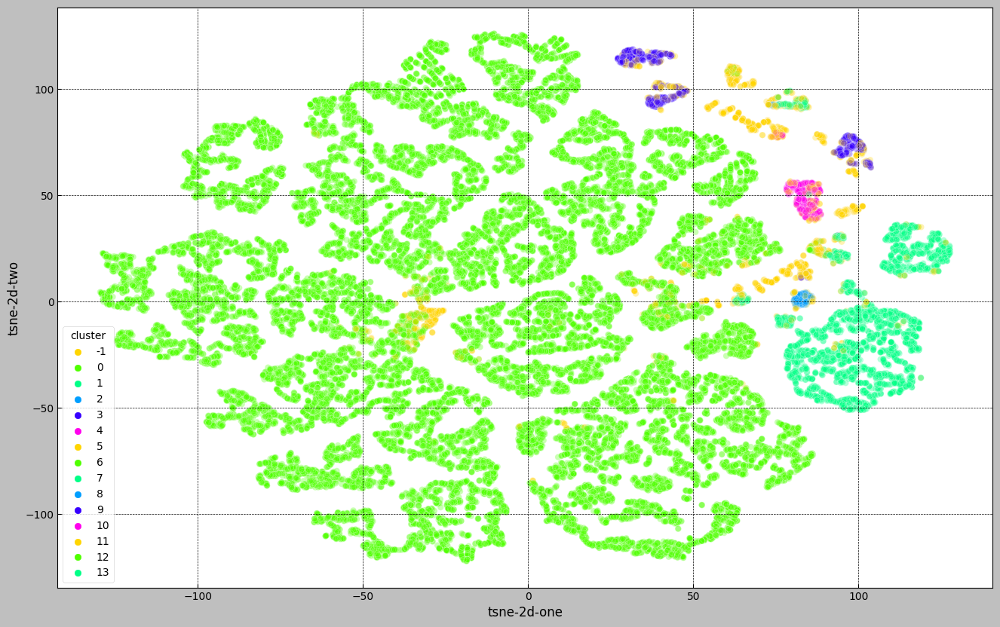

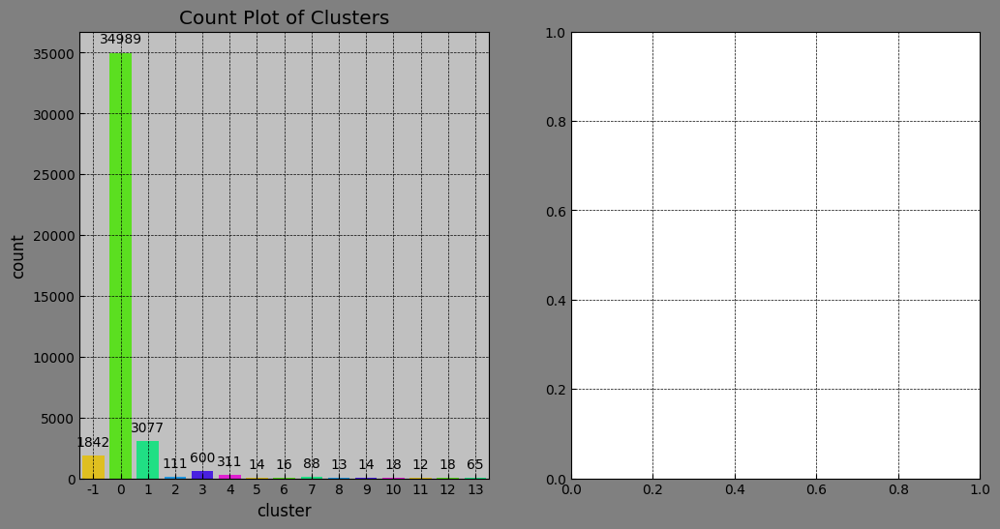

In [ ]:
# Visualizing the clusters using t-SNE for the 4 clusters

from sklearn.manifold import TSNE
import seaborn as sns
import matplotlib.pyplot as plt

tsne = TSNE(n_components=2, random_state=1)
tsne_results = tsne.fit_transform(X_cluster)

DBV['tsne-2d-one'] = tsne_results[:,0]
DBV['tsne-2d-two'] = tsne_results[:,1]

plt.figure(figsize=(16,10))
sns.scatterplot(
    x="tsne-2d-one", y="tsne-2d-two",
    hue="cluster",
    palette=sns.color_palette("hsv", len(set(labels))),
    data=DBV,
    legend="full",
    alpha=0.3
)

custom_colors = sns.color_palette("hsv", len(set(labels)))

fig, ax = plt.subplots(1, 2, figsize=(12,6),facecolor='gray')
ax[0].set_facecolor('silver')

sns.countplot(x='cluster', data=DBV, ax=ax[0], palette=custom_colors)
for p in ax[0].patches:
    ax[0].annotate(format(p.get_height(), '.0f'),
                   (p.get_x() + p.get_width() / 2., p.get_height()),
                   ha='center', va='center', xytext=(0, 10),
                   textcoords='offset points')
ax[0].grid(True)
ax[0].set_title('Count Plot of Clusters')

# Fine tuning best model

# Analyising cluster content

## GMM

In [ ]:
# Analyzing the clusters for best GMM model
GMM_best

GaussianMixture(covariance_type='diag', init_params='k-means++', n_components=2,
                random_state=1)

In [ ]:
print ('silhouette_score : ' , silhouette_score (X_cluster , GMM_best.predict(X_cluster)))
print ('calinski_harabasz_score : ' , calinski_harabasz_score (X_cluster, GMM_best.predict(X_cluster)))
print ('davies_bouldin_score : ' , davies_bouldin_score (X_cluster, GMM_best.predict(X_cluster)))

silhouette_score :  0.3602813465255337
calinski_harabasz_score :  8465.606260925839
davies_bouldin_score :  1.619821778350159


In [ ]:
# Analyzing the clusters

gmmV = df_cluster.copy ()
gmmV ['cluster'] = GMM_best.predict(X_cluster)

cluster_stats = gmmV.groupby('cluster').describe()
print(cluster_stats)

             age                                                     duration  \
           count       mean        std   min   25%   50%   75%   max    count   
cluster                                                                         
0         5625.0  40.453156  12.629950  17.0  31.0  37.0  48.0  98.0   5625.0   
1        35563.0  39.956190  10.025968  18.0  32.0  38.0  47.0  98.0  35563.0   

                                                                  campaign  \
               mean         std  min    25%    50%    75%     max    count   
cluster                                                                      
0        265.889600  239.481083  1.0  115.0  199.0  328.0  3509.0   5625.0   
1        257.082192  262.256835  0.0  100.0  177.0  318.0  4918.0  35563.0   

                                                         pdays              \
             mean       std  min  25%  50%  75%   max    count        mean   
cluster                                        

In [ ]:
# Scaled data

gmmV = X_cluster.copy ()
gmmV ['cluster'] = GMM_best.predict(X_cluster)

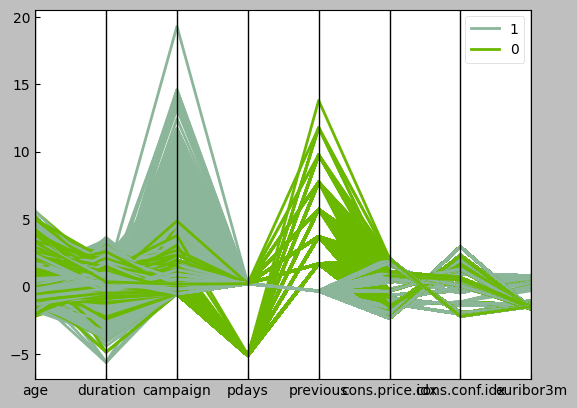

In [ ]:
from pandas.plotting import parallel_coordinates
# Normalize your dataset if necessary to make the plot more interpretable
parallel_coordinates(gmmV.assign(cluster=gmmV['cluster'].astype(str)), 'cluster')
plt.show()

c:\Users\valhk\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


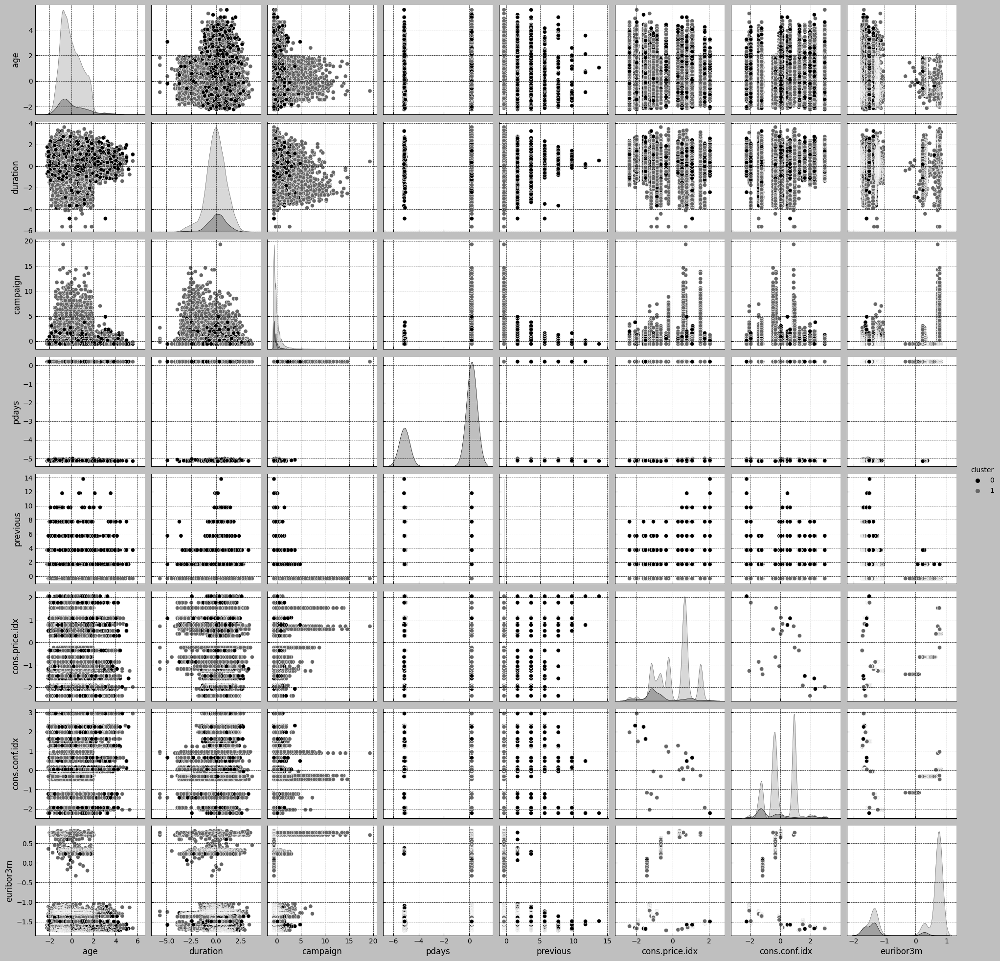

In [ ]:
import seaborn as sns
sns.pairplot(gmmV, hue='cluster')

In [ ]:
gmmV = X_cluster.copy ()
gmmV ['cluster'] = GMM_best.predict(X_cluster)

In [ ]:
gmmV

,age,duration,campaign,pdays,previous,cons.price.idx,cons.conf.idx,euribor3m,cluster
0,1.533034,0.431124,-0.565922,0.195414,-0.349494,0.722722,0.886447,0.712460,1
1,1.628993,-0.177114,-0.565922,0.195414,-0.349494,0.722722,0.886447,0.712460,1
2,-0.290186,0.274738,-0.565922,0.195414,-0.349494,0.722722,0.886447,0.712460,1
3,-0.002309,-0.162669,-0.565922,0.195414,-0.349494,0.722722,0.886447,0.712460,1
4,1.533034,0.607534,-0.565922,0.195414,-0.349494,0.722722,0.886447,0.712460,1
...,...,...,...,...,...,...,...,...,...
41183,3.164336,0.699178,-0.565922,0.195414,-0.349494,2.058168,-2.224953,-1.495186,1
41184,0.573445,0.848058,-0.565922,0.195414,-0.349494,2.058168,-2.224953,-1.495186,1
41185,1.533034,0.080692,-0.204909,0.195414,-0.349494,2.058168,-2.224953,-1.495186,1
41186,0.381527,1.003934,-0.565922,0.195414,-0.349494,2.058168,-2.224953,-1.495186,1


In [ ]:
used_columns = gmmV.columns[:-1]
centroids = pd.DataFrame(GMM_best.means_, columns=used_columns[:10])  # Assuming the last column is 'cluster'
print(centroids)

        age  duration  campaign     pdays  previous  cons.price.idx  \
0  0.041180  0.091179 -0.220376 -1.235465  2.209608       -0.765050   
1 -0.006513 -0.014422  0.034857  0.195414 -0.349494        0.121008   

   cons.conf.idx  euribor3m  
0      -0.250744  -1.228060  
1       0.039660   0.194243  


In [ ]:
# Print unscaled centroids

centroids_unscaled = pd.DataFrame(scaler.inverse_transform(GMM_best.means_), columns=used_columns[:10])
print(centroids_unscaled)

         age  duration  campaign       pdays      previous  cons.price.idx  \
0  40.453200  5.256641  1.957155  731.556305  1.266487e+00       93.132828   
1  39.956183  5.159812  2.664146  999.000000  6.661338e-16       93.645708   

   cons.conf.idx  euribor3m  
0     -41.663079   1.491312  
1     -40.319047   3.958190  


## Mean Shift

In [ ]:
MS

MeanShift()

In [ ]:
MS.get_params()

{'bandwidth': None,
 'bin_seeding': False,
 'cluster_all': True,
 'max_iter': 300,
 'min_bin_freq': 1,
 'n_jobs': None,
 'seeds': None}

In [ ]:
labels = MS.labels_

print ('silhouette_score : ' , silhouette_score (X_cluster , labels))
print ('calinski_harabasz_score : ' , calinski_harabasz_score (X_cluster, labels))
print ('davies_bouldin_score : ' , davies_bouldin_score (X_cluster, labels))

silhouette_score :  0.5253757683983563
calinski_harabasz_score :  2190.6908689358556
davies_bouldin_score :  1.509877065533087


In [ ]:
# Analyzing the clusters

MSv = df_cluster.copy ()
MSv ['cluster'] = MS.labels_

cluster_stats = MSv.groupby('cluster').describe()
print(cluster_stats)

             age                                                     duration  \
           count       mean        std   min   25%   50%   75%   max    count   
cluster                                                                         
0        39600.0  39.955152  10.177054  17.0  32.0  38.0  47.0  98.0  39600.0   
1         1441.0  41.716169  15.207612  17.0  30.0  37.0  52.0  98.0   1441.0   
2           67.0  47.358209  18.279564  20.0  32.5  46.0  58.5  92.0     67.0   
3           35.0  34.428571   9.938889  19.0  26.5  34.0  38.0  64.0     35.0   
4           40.0  40.575000   9.164837  25.0  34.0  38.5  47.5  58.0     40.0   
5            5.0  34.600000  13.722245  26.0  29.0  29.0  30.0  59.0      5.0   

                                                                   campaign  \
               mean         std   min    25%    50%    75%     max    count   
cluster                                                                       
0        256.065758  259.193410  

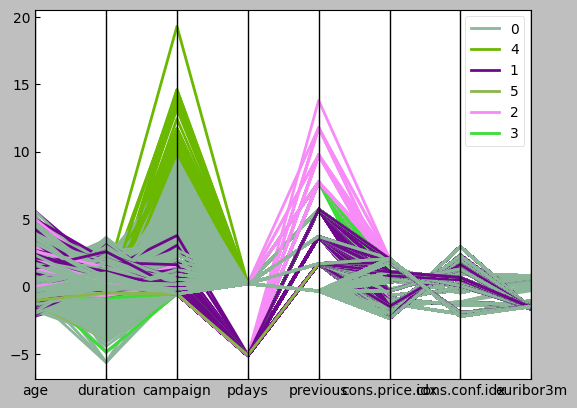

In [ ]:
# Scaled data

MMv_s = X_cluster.copy ()
MMv_s ['cluster'] = MS.labels_


from pandas.plotting import parallel_coordinates
# Normalize your dataset if necessary to make the plot more interpretable
parallel_coordinates(MMv_s.assign(cluster=MMv_s['cluster'].astype(str)), 'cluster')
plt.show()

c:\Users\valhk\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


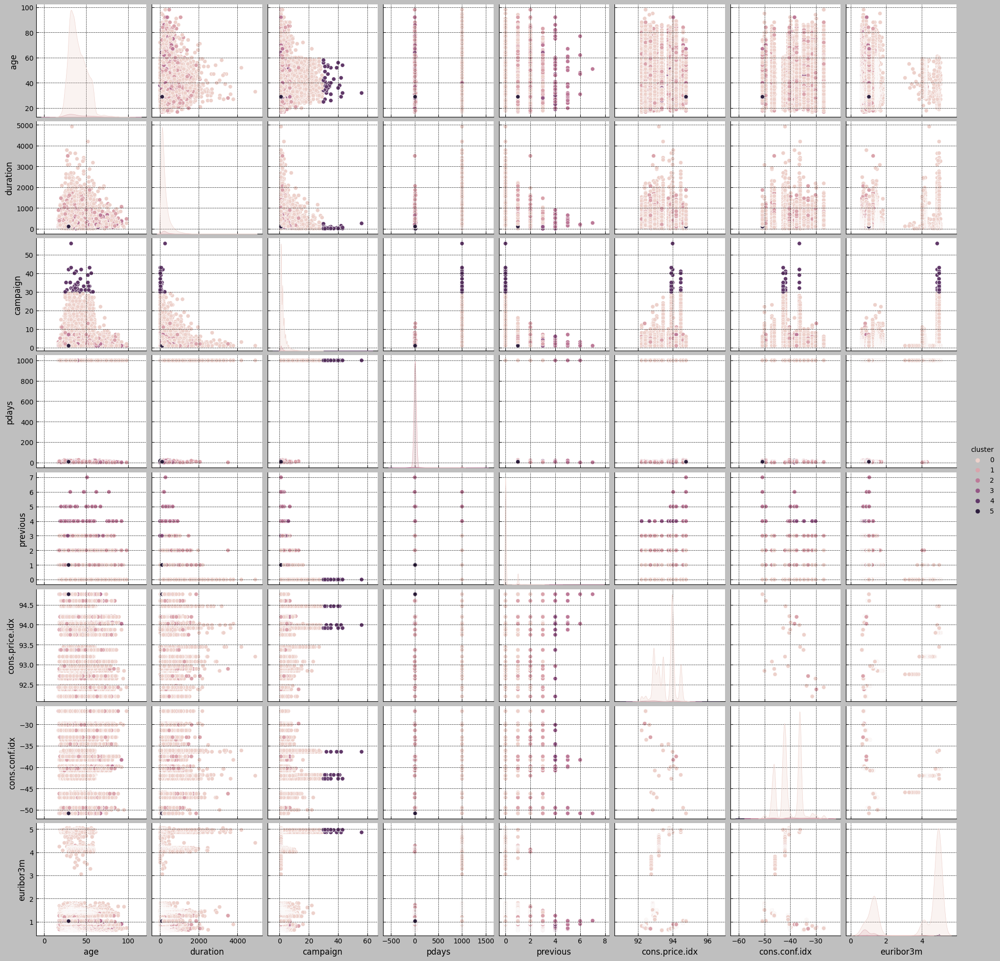

In [ ]:
import seaborn as sns
sns.pairplot(MSv, hue='cluster')

In [ ]:
used_columns = MMv_s.columns[:-1]
centroids = pd.DataFrame(MS.cluster_centers_, columns=used_columns[:MS.cluster_centers_.shape[1]])

print(centroids)


        age  duration   campaign     pdays   previous  cons.price.idx  \
0 -0.012133  0.047151  -0.131636  0.195414  -0.306451        0.336637   
1 -0.275327  0.455110  -0.284099 -5.115685   2.158695       -0.385605   
2  1.940860  0.679563  -0.475669 -5.109317  11.269130        2.058168   
3 -0.578062 -4.286692  -0.565922 -5.125367   6.722712        0.928309   
4 -0.769980  0.431124  19.289818  0.195414  -0.349494        0.722722   
5 -1.345734 -3.886459  -0.565922 -5.063840   1.671136        1.771384   

   cons.conf.idx  euribor3m  
0       0.135650   0.499259  
1       0.152507  -1.450884  
2      -2.224953  -1.487835  
3       0.562342  -1.577923  
4       0.886447   0.713036  
5      -1.944063  -1.524591  


In [ ]:
# print unscaled centroids

centroids_unscaled = pd.DataFrame(scaler.inverse_transform(MS.cluster_centers_), columns=used_columns[:MS.cluster_centers_.shape[1]])

print(centroids_unscaled)

         age  duration   campaign       pdays  previous  cons.price.idx  \
0  39.897625  5.216270   2.202964  999.000000  0.021302       93.770521   
1  37.154839  5.590338   1.780645    6.309677  1.241290       93.352463   
2  60.250000  5.796145   1.250000    7.500000  5.750000       94.767000   
3  34.000000  1.242453   1.000000    4.500000  3.500000       94.113000   
4  32.000000  5.568345  56.000000  999.000000  0.000000       93.994000   
5  26.000000  1.609438   1.000000   16.000000  1.000000       94.601000   

   cons.conf.idx  euribor3m  
0     -39.874795   4.487220  
1     -39.796774   1.104839  
2     -50.800000   1.040750  
3     -37.900000   0.884500  
4     -36.400000   4.858000  
5     -49.500000   0.977000  
